Импорт библиотек

In [13]:
# block_1_setup
import torch
import torch.nn as nn
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import clip
from transformers import BlipProcessor, BlipForConditionalGeneration
import os
import warnings
warnings.filterwarnings('ignore')

print("Библиотеки загружены успешно")

Библиотеки загружены успешно


Конфигурация (исп. CPU)

In [14]:
# block_2_config.py
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

# Пути к данным
DATASET_PATH = "dataset"
IMAGES_PATH = os.path.join(DATASET_PATH, "Images")
CAPTIONS_FILE = os.path.join(DATASET_PATH, "captions.txt")

print("Конфигурация установлена")

Using device: cpu
Конфигурация установлена


Загрузка описаний и изображений

Загрузка датасета...
Датасет загружен: 40455 описаний
Уникальных изображений: 8091
Доступно изображений: 8091
Среднее количество описаний на изображение: 5.00

Примеры из датасета (3 изображений):

2144049642_070cf541b4.jpg:
   1. A girl colors with markers .
   2. A little girl is carefully coloring in the pictures of a coloring book .

2844641033_dab3715a99.jpg:
   1. A black boy in orange and white trucks on playing in the sand .
   2. A black boy is sitting in the sand .

2565703445_dd6899bc0e.jpg:
   1. A man gazes over the rail in the peaceful early morning .
   2. A man looks out at the water under a bridge and against a skyline .


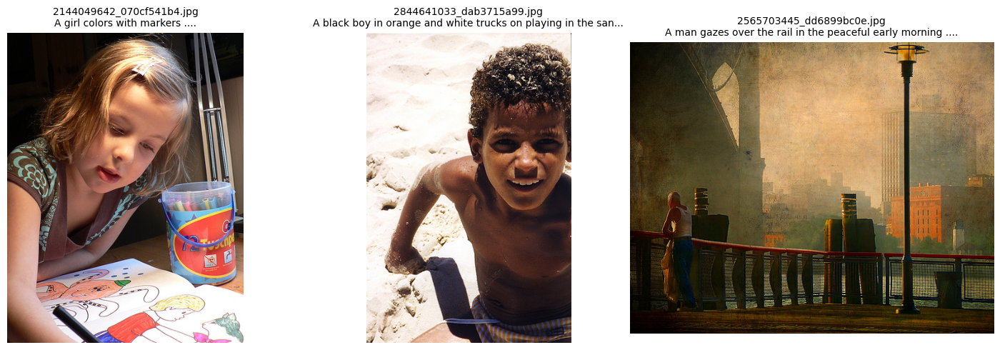

In [15]:
# block_3_data_loading
class DataLoader:
    def __init__(self, dataset_path=DATASET_PATH):
        self.dataset_path = dataset_path
        self.images_path = IMAGES_PATH
        self.captions_file = CAPTIONS_FILE
        self.load_data()
    
    def load_data(self):
        """Загрузка и подготовка данных"""
        print("Загрузка датасета...")
        
        # Загрузка captions.txt
        self.df = pd.read_csv(self.captions_file)
        print(f"Датасет загружен: {len(self.df)} описаний")
        print(f"Уникальных изображений: {self.df['image'].nunique()}")
        
        # Доступны ли изображения(файлы), если да - добавляем
        self.available_images = []
        for img_name in self.df['image'].unique():
            img_path = os.path.join(self.images_path, img_name)
            if os.path.exists(img_path):
                self.available_images.append(img_name)
        
        print(f"Доступно изображений: {len(self.available_images)}")
        
        # Фильтруем датасет по доступным изображениям
        self.df = self.df[self.df['image'].isin(self.available_images)]
        
        # Создаем словарь для быстрого доступа к описаниям
        self.image_to_captions = {}
        for img_name in self.available_images:
            captions = self.df[self.df['image'] == img_name]['caption'].tolist()
            self.image_to_captions[img_name] = captions
        
        # Статистика
        print(f"Среднее количество описаний на изображение: {len(self.df) / len(self.available_images):.2f}")
    
    # Показать примеры датасета, для примера указано в значении по умолчанию 3 изобр.
    def show_dataset_samples(self, num_samples=3):
        """Показать примеры из датасета"""
        print(f"\nПримеры из датасета ({num_samples} изображений):")
        
        sample_images = np.random.choice(self.available_images, 
                                       min(num_samples, len(self.available_images)), 
                                       replace=False)
        
        fig, axes = plt.subplots(1, num_samples, figsize=(15, 5))
        if num_samples == 1:
            axes = [axes]
        
        for i, img_name in enumerate(sample_images):
            img_path = os.path.join(self.images_path, img_name)
            captions = self.image_to_captions[img_name]
            
            try:
                img = Image.open(img_path)
                axes[i].imshow(img)
                axes[i].set_title(f"{img_name}\n{captions[0][:60]}...", fontsize=10)
                axes[i].axis('off')
                
                print(f"\n{img_name}:")
                for j, caption in enumerate(captions[:2]):  # Показываем первые 2 описания
                    print(f"   {j+1}. {caption}")
                    
            except Exception as e:
                print(f"Ошибка загрузки {img_name}: {e}")
                axes[i].text(0.5, 0.5, f"Error\n{img_name}", ha='center', va='center')
                axes[i].axis('off')
        
        plt.tight_layout()
        plt.show()

# Загрузка данных
data_loader = DataLoader()
data_loader.show_dataset_samples(3)

Загрузка моделей BLIP, CLIP

In [16]:
# block_4_model_loading
class ModelLoader:
    def __init__(self):
        self.setup_models()
    
    def setup_models(self):
        """Инициализация моделей"""
        print("Загрузка моделей...")
        
        # CLIP для сопоставления текста и изображения
        try:
            import open_clip
            self.clip_model, _, self.clip_preprocess = open_clip.create_model_and_transforms(
                'ViT-B-32', 
                pretrained='openai'
            )
            self.clip_model = self.clip_model.to(device)
            self.clip_tokenizer = open_clip.get_tokenizer('ViT-B-32')
            print("CLIP загружена успешно через open_clip")
            self.clip_available = True
        except Exception as e:
            print(f"Ошибка загрузки CLIP: {e}")
            self.clip_model = None
            self.clip_preprocess = None
            self.clip_tokenizer = None
            self.clip_available = False
        
        # BLIP модель для генерации описаний
        try:
            self.blip_processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
            self.blip_caption_model = BlipForConditionalGeneration.from_pretrained(
                "Salesforce/blip-image-captioning-base"
            ).to(device)
            print("BLIP для генерации описаний загружена успешно")
            self.blip_available = True
        except Exception as e:
            print(f"Ошибка загрузки BLIP: {e}")
            self.blip_processor = None
            self.blip_caption_model = None
            self.blip_available = False

# Загрузка моделей
model_loader = ModelLoader()

Загрузка моделей...
CLIP загружена успешно через open_clip
BLIP для генерации описаний загружена успешно


Инференс моделей


ДЕМОНСТРАЦИЯ ИНФЕРЕНСА CLIP:
Тестовое изображение: 1001773457_577c3a7d70.jpg
Всего текстовых кандидатов: 10
Из них правильных: 5
Неправильных (дистракторов): 5

5 наиболее подходящих описаний:
--------------------------------------------------
1. [Y] Схожесть: 0.3365
   Текст: 'A black dog and a tri-colored dog playing with each other on the road .'

2. [Y] Схожесть: 0.3220
   Текст: 'A black dog and a white dog with brown spots are staring at each other in the street .'

3. [Y] Схожесть: 0.3163
   Текст: 'A black dog and a spotted dog are fighting'

4. [Y] Схожесть: 0.3094
   Текст: 'Two dogs of different breeds looking at each other on the road .'

5. [Y] Схожесть: 0.2952
   Текст: 'Two dogs on pavement moving toward each other .'



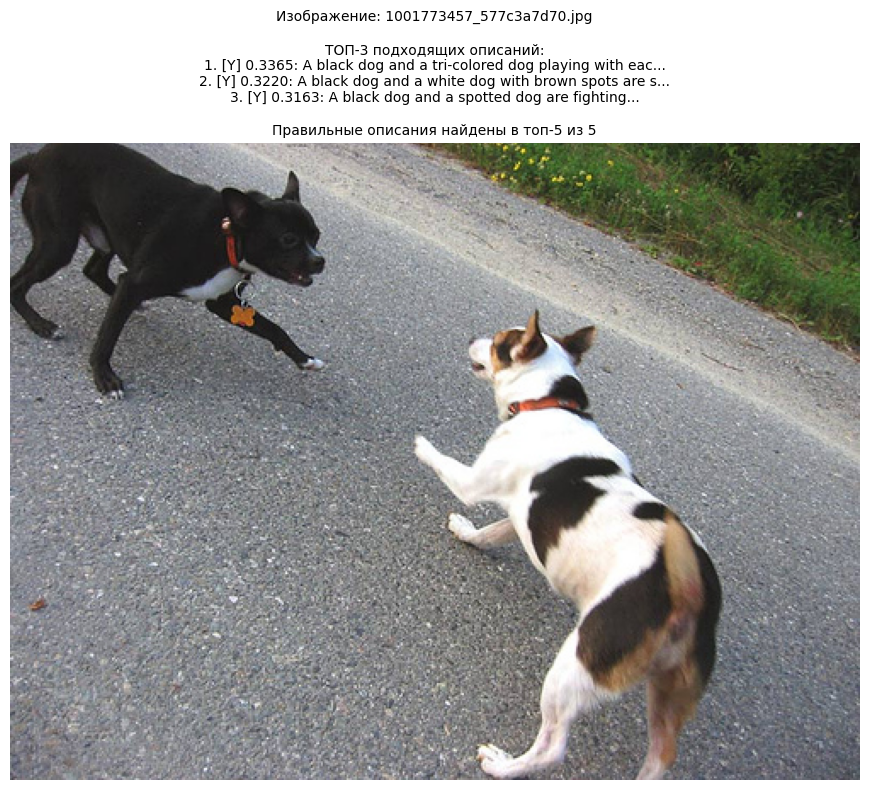


ДЕМОНСТРАЦИЯ ИНФЕРЕНСА BLIP:
Тестовое изображение: 1001773457_577c3a7d70.jpg
Сгенерировано описание:
   'two dogs playing on the side of the road'

Настоящие описания из датасета:
   1. 'A black dog and a spotted dog are fighting'
   2. 'A black dog and a tri-colored dog playing with each other on the road .'
   3. 'A black dog and a white dog with brown spots are staring at each other in the street .'
   4. 'Two dogs of different breeds looking at each other on the road .'
   5. 'Two dogs on pavement moving toward each other .'


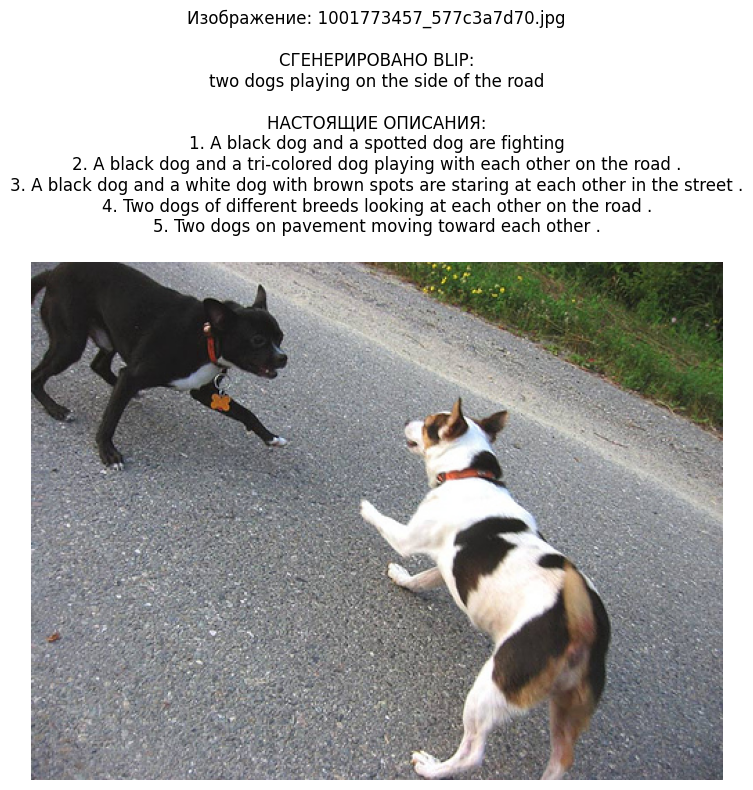

In [17]:
# block_5_inference_demo
class InferenceDemo:
    def __init__(self, data_loader, model_loader):
        self.data_loader = data_loader
        self.model_loader = model_loader
    
    def demo_clip_inference(self):
        """Демонстрация инференса CLIP модели"""
        if not self.model_loader.clip_available:
            print("CLIP не доступен для инференса")
            return None
        
        print("\nДЕМОНСТРАЦИЯ ИНФЕРЕНСА CLIP:")
        print("=" * 50)
        
        # Берем тестовое изображение
        # номер фотографии в квадратных скобках
        test_image_name = self.data_loader.available_images[1]
        test_image_path = os.path.join(IMAGES_PATH, test_image_name)
        
        # Получаем все доступные описания из датасета
        all_captions = list(self.data_loader.image_to_captions.values())
        
        # Создаем список кандидатов: берем настоящие описания для текущего изображения
        # и добавляем случайные описания для других изображений
        true_captions = self.data_loader.image_to_captions[test_image_name]
        
        # Собираем описания для других случайных изображений
        other_captions = []
        for img_name, captions in self.data_loader.image_to_captions.items():
            if img_name != test_image_name:
                other_captions.extend(captions)
        
        # Выбираем случайные "неправильные" описания
        import random
        num_distractors = min(5, len(other_captions))
        false_captions = random.sample(other_captions, num_distractors)
        
        # Создаем финальный список кандидатов
        candidate_texts = true_captions + false_captions
        random.shuffle(candidate_texts)  # перемешиваем
        
        print(f"Тестовое изображение: {test_image_name}")
        print(f"Всего текстовых кандидатов: {len(candidate_texts)}")
        print(f"Из них правильных: {len(true_captions)}")
        print(f"Неправильных (дистракторов): {len(false_captions)}")
        
        # Подготавливаем изображение
        image = Image.open(test_image_path).convert("RGB")
        image_input = self.model_loader.clip_preprocess(image).unsqueeze(0).to(device)
        
        # Кодируем изображение
        with torch.no_grad():
            image_features = self.model_loader.clip_model.encode_image(image_input)
        
        # Кодируем все текстовые кандидаты
        text_inputs = self.model_loader.clip_tokenizer(candidate_texts).to(device)
        with torch.no_grad():
            text_features = self.model_loader.clip_model.encode_text(text_inputs)
        
        # Вычисляем косинусную схожесть для каждого кандидата
        similarities = []
        for i, text_feat in enumerate(text_features):
            similarity = torch.cosine_similarity(image_features, text_feat.unsqueeze(0)).item()
            similarities.append((similarity, candidate_texts[i], candidate_texts[i] in true_captions))
        
        # Сортируем по убыванию кос. схожести
        similarities.sort(key=lambda x: x[0], reverse=True)
        
        # Выводим результаты
        print(f"\n5 наиболее подходящих описаний:")
        print("-" * 50)
        for i, (sim, text, is_correct) in enumerate(similarities[:5]):
            correct_mark = "Y" if is_correct else "N"
            print(f"{i+1}. [{correct_mark}] Схожесть: {sim:.4f}")
            print(f"   Текст: '{text}'")
            print()
        
        # Показываем изображение с результатами
        plt.figure(figsize=(12, 8))
        plt.imshow(image)
        
        # Формируем заголовок с результатами
        result_text = f"Изображение: {test_image_name}\n\n"
        result_text += "ТОП-3 подходящих описаний:\n"
        for i, (sim, text, is_correct) in enumerate(similarities[:3]):
            correct_mark = "Y" if is_correct else "N"
            result_text += f"{i+1}. [{correct_mark}] {sim:.4f}: {text[:50]}...\n"
        
        result_text += f"\nПравильные описания найдены в топ-{sum(1 for _, _, correct in similarities[:5] if correct)} из {len(true_captions)}"
        
        plt.title(result_text, fontsize=10)
        plt.axis('off')
        plt.tight_layout()
        plt.show()
        
        return {
            'image_features': image_features.cpu().numpy(),
            'text_features': text_features.cpu().numpy(),
            'similarities': similarities,
            'true_captions_count': len(true_captions)
        }
    
    def demo_blip_inference(self):
        """Демонстрация инференса BLIP модели"""
        if not self.model_loader.blip_available:
            print("BLIP не доступен для инференса")
            return None
        
        print("\nДЕМОНСТРАЦИЯ ИНФЕРЕНСА BLIP:")
        print("=" * 50)
        
        # Берем тестовое изображение
        # в скобках также указываем номер изображения
        test_image_name = self.data_loader.available_images[1]
        test_image_path = os.path.join(IMAGES_PATH, test_image_name)
        
        print(f"Тестовое изображение: {test_image_name}")
        
        # Генерация описания
        image = Image.open(test_image_path).convert("RGB")
        inputs = self.model_loader.blip_processor(image, return_tensors="pt").to(device)
        
        outputs = self.model_loader.blip_caption_model.generate(
            **inputs, 
            max_length=50,
            min_length=10,
            num_beams=5,              # Как в официальных тестах
            length_penalty=1.2,       # Штраф
            repetition_penalty=1.0,   # Без дополнительного штрафа за повторения
            do_sample=False,          # Только beam search
            early_stopping=True,
            no_repeat_ngram_size=2,
        )

        
        generated_caption = self.model_loader.blip_processor.decode(outputs[0], skip_special_tokens=True)
        
        print(f"Сгенерировано описание:")
        print(f"   '{generated_caption}'")
        
        # Сравнение с настоящими описаниями
        true_captions = self.data_loader.image_to_captions[test_image_name]
        print(f"\nНастоящие описания из датасета:")
        for i, caption in enumerate(true_captions, 1):
            print(f"   {i}. '{caption}'")
        
        # Показываем изображение с сравнением
        plt.figure(figsize=(12, 8))
        plt.imshow(image)
        
        comparison_text = f"Изображение: {test_image_name}\n\n"
        comparison_text += f"СГЕНЕРИРОВАНО BLIP:\n{generated_caption}\n\n"
        comparison_text += "НАСТОЯЩИЕ ОПИСАНИЯ:\n"
        for i, caption in enumerate(true_captions, 1):
            comparison_text += f"{i}. {caption}\n"
        
        plt.title(comparison_text, fontsize=12)
        plt.axis('off')
        plt.tight_layout()
        plt.show()
        
        return generated_caption


# Демонстрация инференса
inference_demo = InferenceDemo(data_loader, model_loader)

if model_loader.clip_available:
    clip_results = inference_demo.demo_clip_inference()

if model_loader.blip_available:
    blip_results = inference_demo.demo_blip_inference()

Поиск изображений с помощью модели CLIP

ДЕМОНСТРАЦИЯ ПОИСКА:

ПОИСК ИЗОБРАЖЕНИЙ ПО ЗАПРОСУ: 'a dog running'
Поиск среди 200 изображений...
Найдено 3 результатов


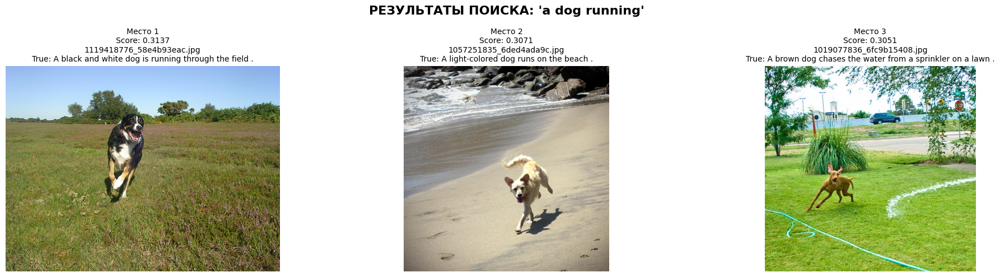


ПОИСК ИЗОБРАЖЕНИЙ ПО ЗАПРОСУ: 'a person riding a bicycle'
Поиск среди 200 изображений...
Найдено 3 результатов


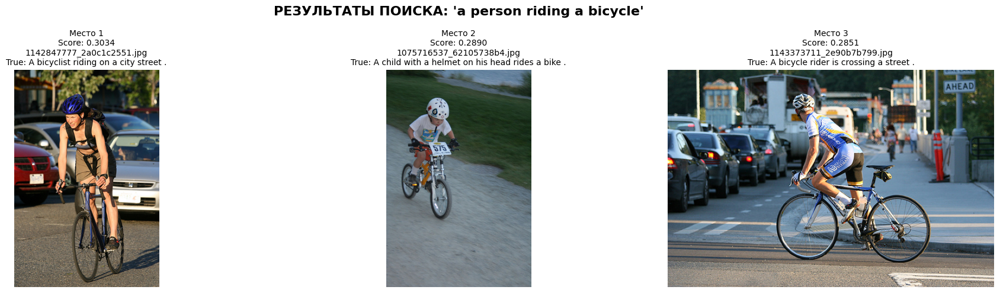

ЗАПУСК ОЦЕНКИ КАЧЕСТВА ПОИСКА...
ОЦЕНКА КАЧЕСТВА ПОИСКА ИЗОБРАЖЕНИЙ ПО ТЕКСТУ

ТЕСТ 1/8: 'a dog running'

ПОИСК ИЗОБРАЖЕНИЙ ПО ЗАПРОСУ: 'a dog running'
Поиск среди 200 изображений...
Найдено 5 результатов


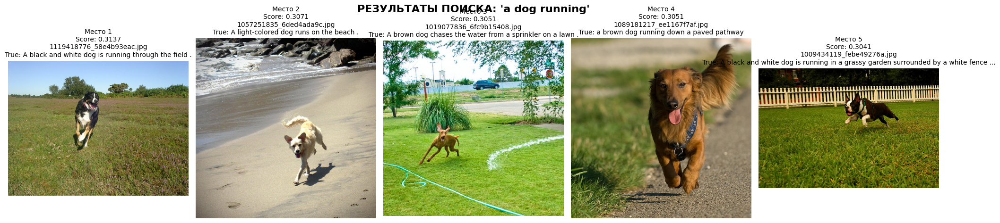

   Метрики: Precision@5: 1.000, Recall@5: 1.000, Accuracy@1: 1.000

ТЕСТ 2/8: 'a person riding a bicycle'

ПОИСК ИЗОБРАЖЕНИЙ ПО ЗАПРОСУ: 'a person riding a bicycle'
Поиск среди 200 изображений...
Найдено 5 результатов


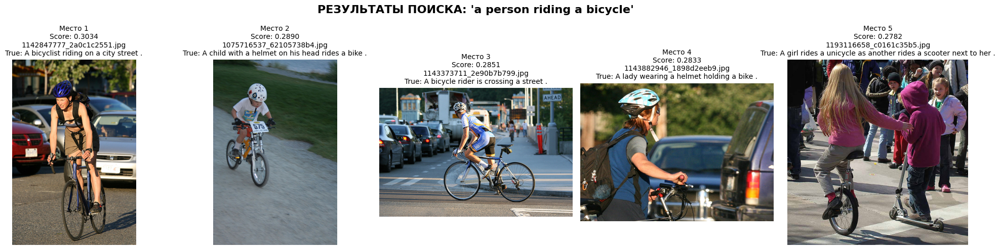

   Метрики: Precision@5: 1.000, Recall@5: 1.000, Accuracy@1: 1.000

ТЕСТ 3/8: 'a child playing'

ПОИСК ИЗОБРАЖЕНИЙ ПО ЗАПРОСУ: 'a child playing'
Поиск среди 200 изображений...
Найдено 5 результатов


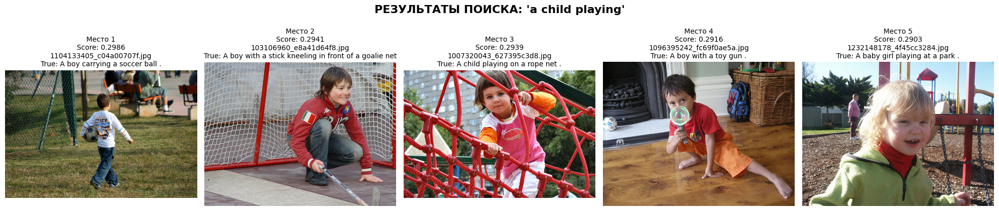

   Метрики: Precision@5: 0.800, Recall@5: 0.800, Accuracy@1: 0.000

ТЕСТ 4/8: 'a group of people'

ПОИСК ИЗОБРАЖЕНИЙ ПО ЗАПРОСУ: 'a group of people'
Поиск среди 200 изображений...
Найдено 5 результатов


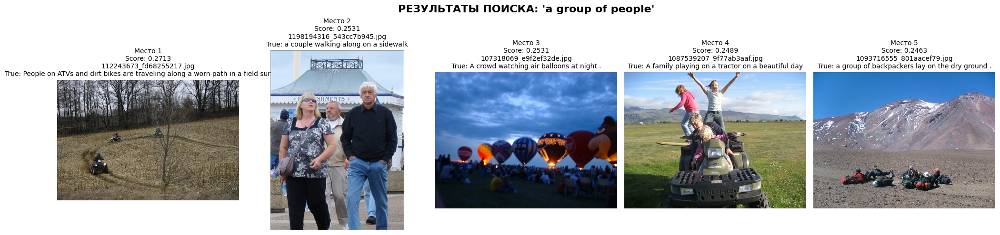

   Метрики: Precision@5: 0.800, Recall@5: 0.800, Accuracy@1: 1.000

ТЕСТ 5/8: 'food on a table'

ПОИСК ИЗОБРАЖЕНИЙ ПО ЗАПРОСУ: 'food on a table'
Поиск среди 200 изображений...
Найдено 5 результатов


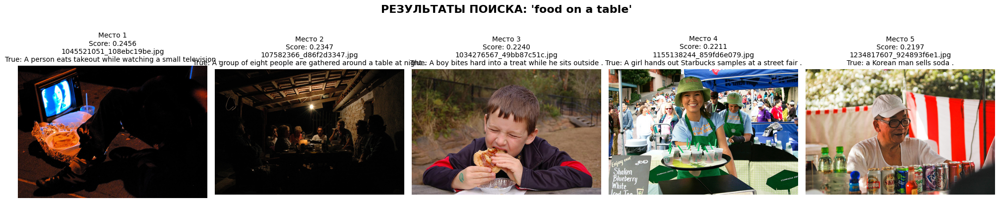

   Метрики: Precision@5: 0.800, Recall@5: 0.800, Accuracy@1: 1.000

ТЕСТ 6/8: 'a car on the road'

ПОИСК ИЗОБРАЖЕНИЙ ПО ЗАПРОСУ: 'a car on the road'
Поиск среди 200 изображений...
Найдено 5 результатов


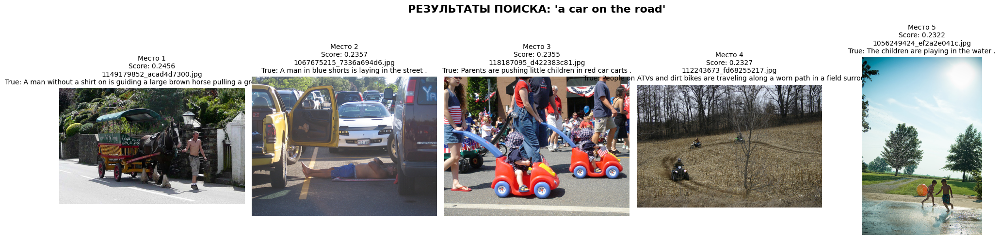

   Метрики: Precision@5: 1.000, Recall@5: 1.000, Accuracy@1: 1.000

ТЕСТ 7/8: 'a person walking'

ПОИСК ИЗОБРАЖЕНИЙ ПО ЗАПРОСУ: 'a person walking'
Поиск среди 200 изображений...
Найдено 5 результатов


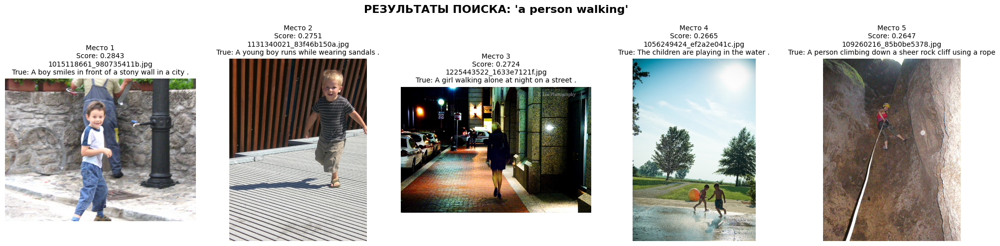

   Метрики: Precision@5: 0.800, Recall@5: 0.800, Accuracy@1: 1.000

ТЕСТ 8/8: 'a building with windows'

ПОИСК ИЗОБРАЖЕНИЙ ПО ЗАПРОСУ: 'a building with windows'
Поиск среди 200 изображений...
Найдено 5 результатов


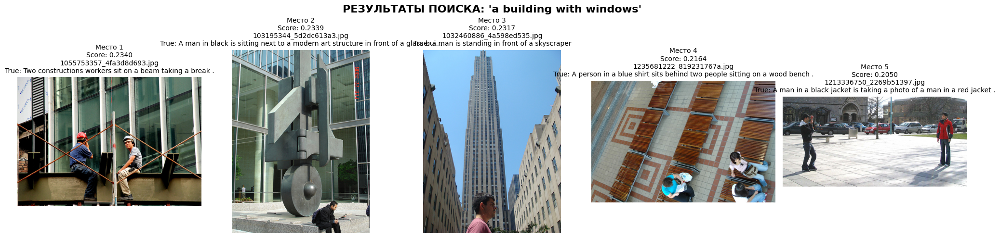

   Метрики: Precision@5: 0.600, Recall@5: 0.600, Accuracy@1: 1.000
Метрики поиска сохранены в файл: search_quality_metrics.txt

Оценка качества завершена!
Результаты сохранены в файл: search_quality_metrics.txt


In [12]:
# block_6_text_to_image_search
from sklearn.metrics import precision_score, recall_score
import numpy as np


class TextToImageSearch:
    def __init__(self, data_loader, model_loader):
        self.data_loader = data_loader
        self.model_loader = model_loader
    
    def search_images_by_text(self, query_text, top_k=5):
        """Поиск изображений по текстовому запросу"""
        if not self.model_loader.clip_available:
            print("CLIP не доступен для поиска")
            return None
        
        print(f"\nПОИСК ИЗОБРАЖЕНИЙ ПО ЗАПРОСУ: '{query_text}'")
        
        # Получаем эмбеддинг текстового запроса
        text_features = self.get_text_features(query_text)
        
        if text_features is None:
            return None
        
        similarities = []
        image_info = []
        
        # Ограничиваем количество (можно увеличить, ограничено для скорости)
        search_images = self.data_loader.available_images[:200]
        
        print(f"Поиск среди {len(search_images)} изображений...")
        
        for img_name in search_images:
            img_path = os.path.join(IMAGES_PATH, img_name)
            image_features = self.get_image_features(img_path)
            
            if image_features is not None:
                similarity = cosine_similarity(text_features, image_features)[0][0]
                similarities.append(similarity)
                image_info.append({
                    'path': img_path,
                    'name': img_name,
                    'true_captions': self.data_loader.image_to_captions[img_name]
                })
        
        # Сортируем по схожести
        results = sorted(zip(similarities, image_info), reverse=True)[:top_k]
        
        print(f"Найдено {len(results)} результатов")
        
        # Визуализируем результаты
        self.visualize_search_results(query_text, results)
        
        return results
    
    def get_image_features(self, image_path):
        """Получение эмбеддингов изображения"""
        try:
            image = Image.open(image_path).convert("RGB")
            image_input = self.model_loader.clip_preprocess(image).unsqueeze(0).to(device)
            
            with torch.no_grad():
                image_features = self.model_loader.clip_model.encode_image(image_input)
            
            return image_features.cpu().numpy()
        except Exception as e:
            print(f"Ошибка обработки изображения {image_path}: {e}")
            return None
    
    def get_text_features(self, text):
        """Получение эмбеддингов текста"""
        try:
            text_input = self.model_loader.clip_tokenizer([text]).to(device)
            
            with torch.no_grad():
                text_features = self.model_loader.clip_model.encode_text(text_input)
            
            return text_features.cpu().numpy()
        except Exception as e:
            print(f"Ошибка обработки текста '{text}': {e}")
            return None
    
    def visualize_search_results(self, query, results):
        """Визуализация результатов поиска"""
        if not results:
            print("Нет результатов для визуализации")
            return
        
        num_results = len(results)
        fig, axes = plt.subplots(1, num_results, figsize=(20, 5))
        if num_results == 1:
            axes = [axes]
        
        fig.suptitle(f"РЕЗУЛЬТАТЫ ПОИСКА: '{query}'", fontsize=16, fontweight='bold')
        
        for i, (score, img_info) in enumerate(results):
            try:
                img = Image.open(img_info['path'])
                axes[i].imshow(img)
                
                # Показываем первую настоящую подпись для сравнения
                true_caption = img_info['true_captions'][0][:80] + "..." if len(img_info['true_captions'][0]) > 80 else img_info['true_captions'][0]
                
                axes[i].set_title(
                    f"Место {i+1}\n"
                    f"Score: {score:.4f}\n"
                    f"{img_info['name']}\n"
                    f"True: {true_caption}",
                    fontsize=10
                )
                axes[i].axis('off')
                
                # print(f"\nРЕЗУЛЬТАТ {i+1}:")
                # print(f"   Изображение: {img_info['name']}")
                # print(f"   Схожесть: {score:.4f}")
                # print(f"   Настоящие описания:")
                # for j, caption in enumerate(img_info['true_captions'][:2]):
                #     print(f"      {j+1}. {caption}")
                    
            except Exception as e:
                print(f"Ошибка визуализации {img_info['name']}: {e}")
                axes[i].text(0.5, 0.5, f"Error\n{img_info['name']}", ha='center', va='center')
                axes[i].axis('off')
        
        plt.tight_layout()
        plt.show()
    

    #################################################
    # Добавим метрики для оценки модели в этой задаче
    def evaluate_search_quality(self, test_queries, top_k=5):
        """Оценка качества поиска по нескольким тестовым запросам"""
        if not self.model_loader.clip_available:
            print("CLIP не доступен для оценки")
            return None
        
        #print(f"\n{'='*60}")
        print("ОЦЕНКА КАЧЕСТВА ПОИСКА ИЗОБРАЖЕНИЙ ПО ТЕКСТУ")
        #print(f"{'='*60}")
        
        all_metrics = {
            'precision@k': [],
            'recall@k': [], 
            'mAP@k': [],
            'ndcg@k': [],
            'success_rate@k': [],
            'accuracy@1': []
        }
        
        for i, query in enumerate(test_queries):
            print(f"\nТЕСТ {i+1}/{len(test_queries)}: '{query}'")
            
            # Получаем результаты поиска
            results = self.search_images_by_text(query, top_k=top_k)
            if not results:
                continue
                
            # Оцениваем качество для этого запроса
            query_metrics = self._evaluate_single_query(query, results, top_k)
            
            # Собираем метрики
            for metric, value in query_metrics.items():
                all_metrics[metric].append(value)
            
            print(f"   Метрики: Precision@{top_k}: {query_metrics['precision@k']:.3f}, "
                f"Recall@{top_k}: {query_metrics['recall@k']:.3f}, "
                f"Accuracy@1: {query_metrics['accuracy@1']:.3f}")

        # Вычисляем средние метрики
        final_metrics = self._compute_final_metrics(all_metrics)
        
        # Сохраняем в файл
        self._save_search_metrics_to_file(test_queries, all_metrics, final_metrics, top_k)
        
        return final_metrics

    def _evaluate_single_query(self, query, results, top_k):
        """Оценка качества для одного запроса"""
        # Определяем релевантность результатов
        relevant_flags = []
        
        for score, img_info in results:
            # Проверяем, релевантно ли изображение запросу
            is_relevant = self._is_relevant_image(query, img_info['true_captions'])
            relevant_flags.append(int(is_relevant))
        
        # ВЫЧИСЛЯЕМ ACCURACY@1 С ПОМОЩЬЮ SKLEARN
        # Accuracy@1 = проверяем только первый результат
        y_true = [1]  # Ожидаем, что первый результат релевантен
        y_pred = [relevant_flags[0]]  # Фактический результат
        accuracy = accuracy_score(y_true, y_pred)

        
        # Вычисляем остальные метрики
        precision = self._calculate_precision_at_k(relevant_flags, top_k)
        recall = self._calculate_recall_at_k(relevant_flags, top_k, len(relevant_flags))
        map_score = self._calculate_map_at_k(relevant_flags, top_k)
        ndcg = self._calculate_ndcg_at_k(relevant_flags, top_k)
        success_rate = self._calculate_success_rate_at_k(relevant_flags, top_k)
        
        return {
            'precision@k': precision,
            'recall@k': recall,
            'mAP@k': map_score,
            'ndcg@k': ndcg,
            'success_rate@k': success_rate,
            'accuracy@1': accuracy
        }

    def _is_relevant_image(self, query, true_captions):
        """Определяет, релевантно ли изображение текстовому запросу"""
        query_words = set(query.lower().split())
        
        for caption in true_captions:
            caption_words = set(caption.lower().split())
            # Если есть значительное пересечение слов - считаем релевантным
            common_words = query_words.intersection(caption_words)
            if len(common_words) >= max(2, len(query_words) * 0.3):  # Порог 30% совпадения
                return True
        
        return False

    def _calculate_precision_at_k(self, relevant_flags, k):
        """Precision@K - доля релевантных среди первых K результатов"""
        if len(relevant_flags) < k:
            k = len(relevant_flags)
        return sum(relevant_flags[:k]) / k

    def _calculate_recall_at_k(self, relevant_flags, k, total_relevant):
        """Recall@K - доля найденных релевантных из всех возможных"""
        if total_relevant == 0:
            return 0.0
        if len(relevant_flags) < k:
            k = len(relevant_flags)
        return sum(relevant_flags[:k]) / total_relevant

    def _calculate_map_at_k(self, relevant_flags, k):
        """Mean Average Precision@K"""
        if len(relevant_flags) < k:
            k = len(relevant_flags)
        
        precision_scores = []
        relevant_count = 0
        
        for i, is_relevant in enumerate(relevant_flags[:k]):
            if is_relevant:
                relevant_count += 1
                precision_scores.append(relevant_count / (i + 1))
        
        if not precision_scores:
            return 0.0
        
        return sum(precision_scores) / len(precision_scores)

    def _calculate_ndcg_at_k(self, relevant_flags, k):
        """Normalized Discounted Cumulative Gain@K"""
        if len(relevant_flags) < k:
            k = len(relevant_flags)
        
        # DCG
        dcg = sum((2 ** rel - 1) / np.log2(i + 2) for i, rel in enumerate(relevant_flags[:k]))
        
        # Ideal DCG
        ideal_relevant = sorted(relevant_flags, reverse=True)[:k]
        idcg = sum((2 ** rel - 1) / np.log2(i + 2) for i, rel in enumerate(ideal_relevant))
        
        return dcg / idcg if idcg > 0 else 0.0

    def _calculate_success_rate_at_k(self, relevant_flags, k):
        """Success Rate@K - есть ли хотя бы один релевантный в топ-K"""
        return 1.0 if any(relevant_flags[:k]) else 0.0

    def _compute_final_metrics(self, all_metrics):
        """Вычисляет финальные средние метрики"""
        return {
            metric: np.mean(values) if values else 0.0 
            for metric, values in all_metrics.items()
        }

    def _save_search_metrics_to_file(self, test_queries, all_metrics, final_metrics, top_k, filename="search_quality_metrics.txt"):
        """Сохраняет метрики поиска в файл"""
        try:
            with open(filename, 'w', encoding='utf-8') as f:
                f.write("МЕТРИКИ КАЧЕСТВА ПОИСКА ИЗОБРАЖЕНИЙ ПО ТЕКСТУ\n")
                f.write("=" * 60 + "\n\n")
                
                f.write(f"ОБЩАЯ ИНФОРМАЦИЯ:\n")
                f.write(f"   Количество тестовых запросов: {len(test_queries)}\n")
                f.write(f"   Top-K для оценки: {top_k}\n")
                f.write(f"   Всего изображений в датасете: {len(self.data_loader.available_images)}\n\n")
                
                # Результаты по запросам
                f.write("ДЕТАЛЬНЫЕ РЕЗУЛЬТАТЫ ПО ЗАПРОСАМ:\n")
                f.write("-" * 60 + "\n")
                
                for i, query in enumerate(test_queries):
                    if i < len(all_metrics['precision@k']):
                        f.write(f"\nЗАПРОС {i+1}: '{query}'\n")
                        f.write(f"   Precision@{top_k}: {all_metrics['precision@k'][i]:.3f}\n")
                        f.write(f"   Recall@{top_k}: {all_metrics['recall@k'][i]:.3f}\n")
                        f.write(f"   mAP@{top_k}: {all_metrics['mAP@k'][i]:.3f}\n")
                        f.write(f"   NDCG@{top_k}: {all_metrics['ndcg@k'][i]:.3f}\n")
                        f.write(f"   Success Rate@{top_k}: {all_metrics['success_rate@k'][i]:.3f}\n")
                        f.write(f"   Accuracy@1: {all_metrics['accuracy@1'][i]:.3f}\n")
                
                # Итоговые метрики
                f.write("\n" + "=" * 60 + "\n")
                f.write("ИТОГОВЫЕ МЕТРИКИ (СРЕДНИЕ)\n")
                f.write("=" * 60 + "\n\n")
                
                f.write("КАЧЕСТВО ПОИСКА:\n")
                for metric, value in final_metrics.items():
                    f.write(f"   {metric:15}: {value:.3f}\n")
                
                # Интерпретация
                f.write("\nМЕТРИКИ:\n")
                f.write(f"   Precision@{top_k}: Доля релевантных в топ-{top_k}\n")
                f.write(f"   Recall@{top_k}: Доля найденных релевантных\n")
                f.write(f"   mAP@{top_k}: Усредненная точность с учетом порядка\n")
                f.write(f"   NDCG@{top_k}: Качество ранжирования (1.0 = идеально)\n")
                f.write(f"   Success Rate@{top_k}: Вероятность найти хоть один релевантный\n")
                f.write(f"   Accuracy@1: Точность самого релевантного результата\n")
                
                # Общий вывод
                f.write(f"\nОБЩИЙ ВЫВОД:\n")
                avg_accuracy = final_metrics['accuracy@1']
                if avg_accuracy > 0.7:
                    f.write(f"   Отличная точность, первый результат почти всегда релевантен.\n")
                elif avg_accuracy > 0.5:
                    f.write(f"   Хорошая точность, модель часто находит правильный результат первым.\n")
                elif avg_accuracy > 0.3:
                    f.write(f"   Удовлетворительная точность.\n")
                else:
                    f.write(f"   Низкая точность.\n")
            
            print(f"Метрики поиска сохранены в файл: {filename}")
            
        except Exception as e:
            print(f"Ошибка сохранения метрик: {e}")
            
# Инициализация поиска
search_engine = TextToImageSearch(data_loader, model_loader)

# Примеры запросов для поиска
if model_loader.clip_available:
    test_queries = [
        "a dog running",
        "a person riding a bicycle", 
        "a child playing",
        "a group of people",
        "food on a table",
        "a car on the road",
        "a person walking", 
        "a building with windows"
    ]
    
    # Демонстрация поиска для нескольких запросов
    print("ДЕМОНСТРАЦИЯ ПОИСКА:")
    for query in test_queries[:2]:
        results = search_engine.search_images_by_text(query, top_k=3)
        print("="*80)
    
    # Полная оценка качества по всем запросам
    #print("\n" + "="*80)
    print("ЗАПУСК ОЦЕНКИ КАЧЕСТВА ПОИСКА...")
    search_metrics = search_engine.evaluate_search_quality(test_queries, top_k=5)
    
    print(f"\nОценка качества завершена!")
    print(f"Результаты сохранены в файл: search_quality_metrics.txt")
else:
    print("CLIP не доступен для поиска")

BLIP для генерации текста

In [18]:
# block_7_image_captioning.py
import torch
import numpy as np
from PIL import Image
import os
import matplotlib.pyplot as plt
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
from nltk.translate.meteor_score import meteor_score
import nltk

class ImageCaptioning:
    def __init__(self, data_loader, model_loader):
        self.data_loader = data_loader
        self.model_loader = model_loader
    
    def generate_caption_blip(self, image_path):
        """BLIP: генерация описания"""
        try:
            image = Image.open(image_path).convert("RGB")
            inputs = self.model_loader.blip_processor(image, return_tensors="pt").to(device)
            
            outputs = self.model_loader.blip_caption_model.generate(
                **inputs, 
                max_length=50,
                min_length=10,
                num_beams=5,              #
                length_penalty=1.2,       # Штраф
                repetition_penalty=1.0,   # Без дополнительного штрафа за повторения
                do_sample=False,          # Только beam search
                early_stopping=True,
                no_repeat_ngram_size=2,
            )
            
            caption = self.model_loader.blip_processor.decode(outputs[0], skip_special_tokens=True)
            return caption
            
        except Exception as e:
            print(f"Ошибка BLIP: {e}")
            return None

    def show_caption_comparison(self, image_path, image_name, true_captions, blip_caption):
        """Показать сравнение сгенерированных и настоящих описаний"""
        try:
            image = Image.open(image_path)
            
            # Формируем заголовок с описаниями
            title_text = f"СРАВНЕНИЕ ОПИСАНИЙ\n\nИзображение: {image_name}\n\n"
            
            if blip_caption:
                title_text += f"BLIP (сгенерировано):\n   '{blip_caption}'\n\n"
            
            title_text += f"НАСТОЯЩИЕ ОПИСАНИЯ:\n"
            for i, caption in enumerate(true_captions[:3]):
                title_text += f"{i+1}. '{caption}'\n"
            
            plt.figure(figsize=(12, 10))
            plt.imshow(image)
            plt.title(title_text, fontsize=11, pad=20)
            plt.axis('off')
            plt.tight_layout()
            plt.show()
            
        except Exception as e:
            print(f"Ошибка отображения изображения {image_name}: {e}")

    def calculate_bleu_score(self, candidate, references):
        """Вычисляет BLEU score между кандидатом и списком референсов"""
        try:
            candidate_tokens = nltk.word_tokenize(candidate.lower())
            references_tokens = [nltk.word_tokenize(ref.lower()) for ref in references]
            
            # BLEU-1, BLEU-2, BLEU-3, BLEU-4
            smoothie = SmoothingFunction().method4
            bleu1 = sentence_bleu(references_tokens, candidate_tokens, 
                                weights=(1, 0, 0, 0), smoothing_function=smoothie)
            bleu2 = sentence_bleu(references_tokens, candidate_tokens, 
                                weights=(0.5, 0.5, 0, 0), smoothing_function=smoothie)
            bleu3 = sentence_bleu(references_tokens, candidate_tokens, 
                                weights=(0.33, 0.33, 0.33, 0), smoothing_function=smoothie)
            bleu4 = sentence_bleu(references_tokens, candidate_tokens, 
                                weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smoothie)
            
            return {
                'BLEU-1': bleu1,
                'BLEU-2': bleu2, 
                'BLEU-3': bleu3,
                'BLEU-4': bleu4
            }
        except Exception as e:
            print(f"Ошибка вычисления BLEU: {e}")
            return {'BLEU-1': 0, 'BLEU-2': 0, 'BLEU-3': 0, 'BLEU-4': 0}

    def calculate_meteor_score(self, candidate, references):
        """Вычисляет METEOR score"""
        try:
            candidate_tokens = nltk.word_tokenize(candidate.lower())
            references_tokens = [nltk.word_tokenize(ref.lower()) for ref in references]
            
            # METEOR требует список референсов
            meteor_scores = []
            for ref_tokens in references_tokens:
                score = meteor_score([ref_tokens], candidate_tokens)
                meteor_scores.append(score)
            
            return max(meteor_scores)  # Берем лучший score среди референсов
        except Exception as e:
            print(f"Ошибка вычисления METEOR: {e}")
            return 0.0

    def calculate_rouge_score(self, candidate, references):
        """Вычисляет ROUGE-L score (упрощенная версия)"""
        try:
            def longest_common_subsequence(text1, text2):
                """Вычисляет длину наибольшей общей подпоследовательности"""
                tokens1 = text1.lower().split()
                tokens2 = text2.lower().split()
                
                m, n = len(tokens1), len(tokens2)
                dp = [[0] * (n + 1) for _ in range(m + 1)]
                
                for i in range(1, m + 1):
                    for j in range(1, n + 1):
                        if tokens1[i-1] == tokens2[j-1]:
                            dp[i][j] = dp[i-1][j-1] + 1
                        else:
                            dp[i][j] = max(dp[i-1][j], dp[i][j-1])
                
                return dp[m][n]
            
            candidate_len = len(candidate.split())
            best_rouge = 0
            
            for ref in references:
                lcs = longest_common_subsequence(candidate, ref)
                ref_len = len(ref.split())
                
                if candidate_len == 0 or ref_len == 0:
                    continue
                    
                precision = lcs / candidate_len
                recall = lcs / ref_len
                
                if precision + recall > 0:
                    f1 = 2 * precision * recall / (precision + recall)
                    best_rouge = max(best_rouge, f1)
            
            return best_rouge
        except Exception as e:
            print(f"Ошибка вычисления ROUGE: {e}")
            return 0.0

    def evaluate_caption_with_metrics(self, generated_caption, true_captions):
        """Оценивает сгенерированное описание с помощью всех метрик"""
        if not generated_caption:
            return {
                'BLEU-1': 0, 'BLEU-2': 0, 'BLEU-3': 0, 'BLEU-4': 0,
                'METEOR': 0, 'ROUGE-L': 0
            }
        
        try:
            bleu_scores = self.calculate_bleu_score(generated_caption, true_captions)
            meteor_score = self.calculate_meteor_score(generated_caption, true_captions)
            rouge_score = self.calculate_rouge_score(generated_caption, true_captions)
            
            return {
                **bleu_scores,
                'METEOR': meteor_score,
                'ROUGE-L': rouge_score
            }
        except Exception as e:
            print(f"Ошибка оценки метрик: {e}")
            return {
                'BLEU-1': 0, 'BLEU-2': 0, 'BLEU-3': 0, 'BLEU-4': 0,
                'METEOR': 0, 'ROUGE-L': 0
            }

    def generate_final_statistics(self, caption_results):
        """Генерирует финальную статистику с стандартными метриками"""
        if not caption_results:
            print("Нет данных для статистики")
            return
        
        print(f"\n{'='*60}")
        print("ФИНАЛЬНАЯ СТАТИСТИКА КАЧЕСТВА BLIP")
        print(f"{'='*60}")
        
        # Собираем все метрики для BLIP
        blip_metrics = {metric: [] for metric in ['BLEU-1', 'BLEU-2', 'BLEU-3', 'BLEU-4', 'METEOR', 'ROUGE-L']}
        
        # Анализируем каждый результат
        for i, result in enumerate(caption_results):
            print(f"\nИЗОБРАЖЕНИЕ {i+1}: {result['image_name']}")
            
            # Оценка BLIP
            if result['blip_caption']:
                blip_scores = self.evaluate_caption_with_metrics(result['blip_caption'], result['true_captions'])
                for metric, score in blip_scores.items():
                    blip_metrics[metric].append(score)
                
                print(f"   BLIP: '{result['blip_caption'][:60]}{'...' if len(result['blip_caption']) > 60 else ''}'")
                print(f"   BLEU-4: {blip_scores['BLEU-4']:.3f} | METEOR: {blip_scores['METEOR']:.3f} | ROUGE-L: {blip_scores['ROUGE-L']:.3f}")
            
            print(f"   Эталон: '{result['true_captions'][0][:60]}{'...' if len(result['true_captions'][0]) > 60 else ''}'")
        
        # Выводим итоговую статистику
        total_images = len(caption_results)
        
        print(f"\n{'='*60}")
        print("ИТОГОВЫЕ МЕТРИКИ BLIP (СРЕДНИЕ)")
        print(f"{'='*60}")
        
        def print_model_stats(model_name, metrics_dict):
            if any(metrics_dict['BLEU-1']):
                print(f"\n{model_name}:")
                for metric in ['BLEU-1', 'BLEU-2', 'BLEU-3', 'BLEU-4', 'METEOR', 'ROUGE-L']:
                    scores = metrics_dict[metric]
                    if scores:
                        avg_score = np.mean(scores)
                        std_score = np.std(scores)
                        print(f"   {metric:8}: {avg_score:.3f} ± {std_score:.3f}")
        
        # Статистика BLIP
        print_model_stats("BLIP (Генерация)", blip_metrics)
        
        print(f"\nОБЩАЯ ИНФОРМАЦИЯ:")
        print(f"   Протестировано изображений: {total_images}")
        print(f"   Всего описаний в датасете: {len(self.data_loader.image_to_captions)}")
        
        stats = {
            'blip_metrics': {metric: np.mean(scores) if scores else 0 for metric, scores in blip_metrics.items()}
        }

        # Сохраняем статистику
        self.save_statistics_to_file(caption_results, stats, total_images)

        return stats
    
    def save_statistics_to_file(self, caption_results, stats, total_images, filename="blip_captioning_statistics.txt"):
        """Сохраняет статистику в текстовый файл"""
        try:
            with open(filename, 'w', encoding='utf-8') as f:
                f.write("СТАТИСТИКА КАЧЕСТВА ГЕНЕРАЦИИ ОПИСАНИЙ BLIP\n")
                f.write("=" * 60 + "\n\n")
                
                f.write(f"ОБЩАЯ ИНФОРМАЦИЯ:\n")
                f.write(f"   Протестировано изображений: {total_images}\n")
                f.write(f"   Всего описаний в датасете: {len(self.data_loader.image_to_captions)}\n\n")
                
                # Детальные результаты по каждому изображению
                f.write("ДЕТАЛЬНЫЕ РЕЗУЛЬТАТЫ:\n")
                f.write("-" * 60 + "\n")
                
                for i, result in enumerate(caption_results):
                    f.write(f"\nИЗОБРАЖЕНИЕ {i+1}: {result['image_name']}\n")
                    
                    if result['blip_caption']:
                        blip_scores = self.evaluate_caption_with_metrics(result['blip_caption'], result['true_captions'])
                        f.write(f"BLIP:\n")
                        f.write(f"   Описание: {result['blip_caption']}\n")
                        f.write(f"   BLEU-1: {blip_scores['BLEU-1']:.3f} | BLEU-2: {blip_scores['BLEU-2']:.3f}\n")
                        f.write(f"   BLEU-3: {blip_scores['BLEU-3']:.3f} | BLEU-4: {blip_scores['BLEU-4']:.3f}\n")
                        f.write(f"   METEOR: {blip_scores['METEOR']:.3f} | ROUGE-L: {blip_scores['ROUGE-L']:.3f}\n")
                    
                    f.write(f"ЭТАЛОН: {result['true_captions'][0]}\n")
                    f.write("-" * 40 + "\n")
                
                # Итоговые метрики
                f.write("\n" + "=" * 60 + "\n")
                f.write("ИТОГОВЫЕ МЕТРИКИ (СРЕДНИЕ)\n")
                f.write("=" * 60 + "\n")
                
                if stats and 'blip_metrics' in stats:
                    f.write("\nBLIP (Генерация):\n")
                    for metric, score in stats['blip_metrics'].items():
                        f.write(f"   {metric}: {score:.3f}\n")
                
                # Интерпретация результатов
                f.write(f"\nИНТЕРПРЕТАЦИЯ МЕТРИК:\n")
                f.write(f"   BLEU-4: Точное совпадение n-gram\n")
                f.write(f"   METEOR: Учитывает синонимы и морфологию\n") 
                f.write(f"   ROUGE-L: Смысловое сходство\n")
                
            print(f"Статистика сохранена в файл: {filename}")
            
        except Exception as e:
            print(f"Ошибка сохранения статистики: {e}")


    # Выбор с сидом для наблюдения за улучшениями метрик в ходе изменения параметров BLIP
    def generate_captions_for_images(self, num_images=5, random_seed=42):
        """Генерация описаний для нескольких изображений с фиксированным random seed"""
        if not self.model_loader.blip_available:
            print("BLIP не доступен для генерации описаний")
            return None, None
        
        print(f"\nГЕНЕРАЦИЯ ОПИСАНИЙ BLIP ДЛЯ {num_images} ИЗОБРАЖЕНИЙ")
        print(f"Random seed: {random_seed} (одинаковые изображения при каждом запуске)")
        
        # Фиксируем random seed для воспроизводимости
        np.random.seed(random_seed)
        
        test_images = np.random.choice(
            self.data_loader.available_images, 
            min(num_images, len(self.data_loader.available_images)), 
            replace=False
        )
        
        results = []
        
        for i, img_name in enumerate(test_images):
            print(f"\n{'='*50}")
            print(f"ИЗОБРАЖЕНИЕ {i+1}/{len(test_images)}: {img_name}")
            print(f"{'='*50}")
            
            img_path = os.path.join(IMAGES_PATH, img_name)
            true_captions = self.data_loader.image_to_captions[img_name]
            
            # Генерация описания BLIP
            blip_caption = self.generate_caption_blip(img_path)
            
            if blip_caption:
                results.append({
                    'image_name': img_name,
                    'image_path': img_path,
                    'true_captions': true_captions,
                    'blip_caption': blip_caption
                })
                
                # Показываем результаты с изображением
                #self.show_caption_comparison(img_path, img_name, true_captions, blip_caption)
        
        # Генерируем финальную статистику
        if results:
            stats = self.generate_final_statistics(results)
            return results, stats
        
        return results, None


#НАБОР ИЗОБРАЖЕНИЙ С СИДОМ
caption_generator = ImageCaptioning(data_loader, model_loader)

if model_loader.blip_available:
    caption_results, final_stats = caption_generator.generate_captions_for_images(
        num_images=50, 
        random_seed=42
    )
    print(f"\nГенерация описаний завершена!")
else:
    print("BLIP не доступен для генерации описаний")


ГЕНЕРАЦИЯ ОПИСАНИЙ BLIP ДЛЯ 50 ИЗОБРАЖЕНИЙ
Random seed: 42 (одинаковые изображения при каждом запуске)

ИЗОБРАЖЕНИЕ 1/50: 3139895886_5a6d495b13.jpg

ИЗОБРАЖЕНИЕ 2/50: 3133825703_359a0c414d.jpg

ИЗОБРАЖЕНИЕ 3/50: 244910177_7c4ec3f65b.jpg

ИЗОБРАЖЕНИЕ 4/50: 2127207912_9298824e66.jpg

ИЗОБРАЖЕНИЕ 5/50: 1810651611_35aae644fb.jpg

ИЗОБРАЖЕНИЕ 6/50: 2271468944_3264d29208.jpg

ИЗОБРАЖЕНИЕ 7/50: 1813777902_07d1d4b00c.jpg

ИЗОБРАЖЕНИЕ 8/50: 146577646_9e64b8c2dc.jpg

ИЗОБРАЖЕНИЕ 9/50: 127490019_7c5c08cb11.jpg

ИЗОБРАЖЕНИЕ 10/50: 3443703471_14845d8850.jpg

ИЗОБРАЖЕНИЕ 11/50: 3676561090_9828a9f6d0.jpg

ИЗОБРАЖЕНИЕ 12/50: 3715559023_70c41b31c7.jpg

ИЗОБРАЖЕНИЕ 13/50: 458213442_12c59e61a0.jpg

ИЗОБРАЖЕНИЕ 14/50: 3220161734_77f42734b9.jpg

ИЗОБРАЖЕНИЕ 15/50: 3483140026_e14f64fdf5.jpg

ИЗОБРАЖЕНИЕ 16/50: 2603125422_659391f961.jpg

ИЗОБРАЖЕНИЕ 17/50: 3396036947_0af6c3aab7.jpg

ИЗОБРАЖЕНИЕ 18/50: 2762702644_2aa3bf9680.jpg

ИЗОБРАЖЕНИЕ 19/50: 2644916196_16f91dae54.jpg

ИЗОБРАЖЕНИЕ 20/50: 2832487464_2d30